# **Lab 1.2 Image Visualization & Image Arithmetic Operation**

In [1]:
import cv2
import numpy as np
import math
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import mpl_toolkits
import os
import matplotlib.animation as animation
from IPython.display import HTML

### **Color Model Visualization**
In this part, you will explore and visualize different color models by separating and displaying each channel individually. The color models we will work with include RGB, HSV, HLS, and YCrCb.<br>

**HINT**: `cv2.cvtColor()`

Display each channel for each color model in RGB space use `direct slicing method (array[...])`.<br>
**Color model:**
- RGB
- HSV
- HLS
- YCrCb



In [10]:
### START CODE HERE ###
pic = 'asset/pic.jpg'
img = cv2.imread(pic)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

### END CODE HERE ###

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-1.png)

</details>

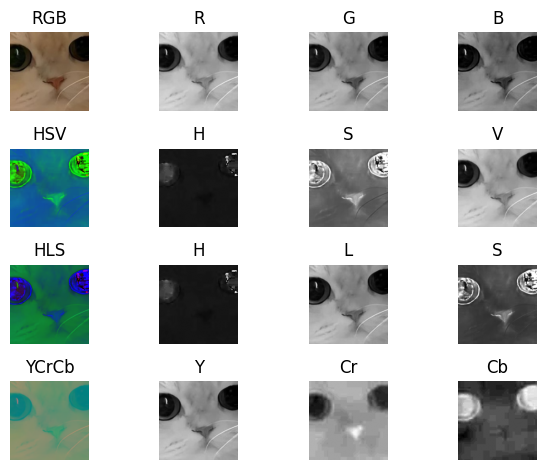

In [11]:
### START CODE HERE ###
fig, axs = plt.subplots(4, 4)
axs[0, 0].imshow(img_rgb)
axs[0, 0].set_title('RGB')
axs[0, 0].axis('off')
axs[0, 1].imshow(img_rgb[:, :, 0], cmap='gray')
axs[0, 1].set_title('R')
axs[0, 1].axis('off')
axs[0, 2].imshow(img_rgb[:, :, 1], cmap='gray')
axs[0, 2].set_title('G')
axs[0, 2].axis('off')
axs[0, 3].imshow(img_rgb[:, :, 2], cmap='gray')
axs[0, 3].set_title('B')
axs[0, 3].axis('off')

axs[1, 0].imshow(img_hsv)
axs[1, 0].set_title('HSV')
axs[1, 0].axis('off')
axs[1, 1].imshow(img_hsv[:, :, 0], cmap='gray')
axs[1, 1].set_title('H')
axs[1, 1].axis('off')
axs[1, 2].imshow(img_hsv[:, :, 1], cmap='gray')
axs[1, 2].set_title('S')
axs[1, 2].axis('off')
axs[1, 3].imshow(img_hsv[:, :, 2], cmap='gray')
axs[1, 3].set_title('V')
axs[1, 3].axis('off')

axs[2, 0].imshow(img_hls)
axs[2, 0].set_title('HLS')
axs[2, 0].axis('off')
axs[2, 1].imshow(img_hls[:, :, 0], cmap='gray')
axs[2, 1].set_title('H')
axs[2, 1].axis('off')
axs[2, 2].imshow(img_hls[:, :, 1], cmap='gray')
axs[2, 2].set_title('L')
axs[2, 2].axis('off')
axs[2, 3].imshow(img_hls[:, :, 2], cmap='gray')
axs[2, 3].set_title('S')
axs[2, 3].axis('off')

axs[3, 0].imshow(img_ycrcb)
axs[3, 0].set_title('YCrCb')
axs[3, 0].axis('off')
axs[3, 1].imshow(img_ycrcb[:, :, 0], cmap='gray')
axs[3, 1].set_title('Y')
axs[3, 1].axis('off')
axs[3, 2].imshow(img_ycrcb[:, :, 1], cmap='gray')
axs[3, 2].set_title('Cr')
axs[3, 2].axis('off')
axs[3, 3].imshow(img_ycrcb[:, :, 2], cmap='gray')
axs[3, 3].set_title('Cb')
axs[3, 3].axis('off')

plt.tight_layout()
plt.show()
### END CODE HERE ###

### **Images addition**
In this part, you will read two images using OpenCV and combine them using a weighted addition. You will explore how changing the weights affects the resulting image.

Read 2 images using OpenCV. Use your own images.

<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-2.png)

</details>

(np.float64(-0.5), np.float64(735.5), np.float64(893.5), np.float64(-0.5))

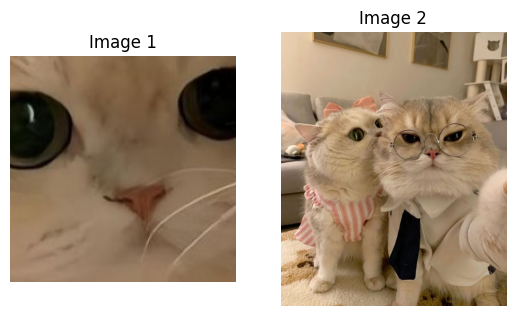

In [2]:
### START CODE HERE ###
pic1 = 'asset/pic.jpg'
pic2 = 'asset/pic2.jpg'
img1 = cv2.imread(pic1)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread(pic2)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
fig, axs = plt.subplots(1, 2)
axs[0].imshow(img1)
axs[0].set_title('Image 1')
axs[0].axis('off')
axs[1].imshow(img2)
axs[1].set_title('Image 2')
axs[1].axis('off')


### END CODE HERE ###

Complete `img_addition()` in the cell below.
$$
\begin{align*}
Im\_addition &= w_1Im_1+w_2Im_2 \\
w_1 + w_2 &= 1.0
\end{align*}
$$

In [3]:
### START CODE HERE ###
def img_addition(img1,img2,w1,w2):
    result = (w1 * img1) + (w2 * img2)
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result
    
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [4]:
a = np.full((20, 20), 255)
b = np.full((20, 20), 255)
test_result = img_addition(a,b,1,1)
assert np.min(test_result) >= 0 and np.max(test_result) <= 255, \
    f"Pixel value out of range: min={np.min(test_result)}, max={np.max(test_result)}"

Use the `img_addition()` function here and save the result to an array for creating a video in a later part. Use weight values in the range [0, 1] with ***at least 20 steps***, ***first increasing from 0 to 1 and then decreasing from 1 back to 0***.

In [5]:
### START CODE HERE ###
 
# Resize img2 to match img1 dimensions
img2_resized = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

# Create weight arrays for at least 20 steps
steps = 20
weights = np.linspace(0, 1, steps + 1)  # 0 to 1
weights = np.concatenate([weights, weights[::-1][1:]])  # Then 1 back to 0

# Create array to store all images
image_array = []

# Generate images with different weight combinations
for w1 in weights:
    w2 = 1 - w1
    result_img = img_addition(img1, img2_resized, w1, w2)
    image_array.append(result_img)

image_array = np.array(image_array)

 
### END CODE HERE ###

Save the array of images to a video. Please complete the function below.

In [6]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    if image_array is None or len(image_array) == 0:
        print("No images to write")
        return
    
    # Get dimensions from first image
    height, width, channels = image_array[0].shape
    
    # Define codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))
    
    # Write each frame to video
    for frame in image_array:
        # Convert RGB to BGR for OpenCV
        frame_bgr = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        out.write(frame_bgr)
    
    # Release the VideoWriter
    out.release()
    print(f"Video saved to {output_file}")
    
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [7]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file = os.path.join(output_folder, "output_image_add.mp4")
write_images_to_video(image_array, output_file)

Video saved to output\output_image_add.mp4


Now use `matplotlib.animation` to display the animation from the images array.

In [9]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
ax.axis('off')

# Create list of artists for animation
ims = []
for img in image_array:
    im = ax.imshow(img)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=100, blit=True, repeat=True)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![addition-2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/addition.gif)

</details>

In [11]:
display(HTML(ani.to_jshtml()))

### **Image Bitwise AND operation**
Complete the `create_image_mask()` function in the cell below. Use `np.zeros()` and fill the desired area with 255. This function will return a mask.

In [ ]:
### START CODE HERE ###
def create_image_mask(height, width, x, y):
    if height is None:
        height, width = img1.shape[:2]
        x, y = width // 4, height // 4  # Default position
    
    # Create a mask with zeros (black)
    image_mask = np.zeros((height, width), dtype=np.uint8)
    
    # Create a rectangular mask in the center or specified position
    mask_height = height // 2
    mask_width = width // 2
    
    # Fill the desired area with 255 (white)
    image_mask[y:y+mask_height, x:x+mask_width] = 255
    
    return image_mask
### END CODE HERE ###

Use your `create_image_mask()` here and display your mask.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-3.png)

</details>

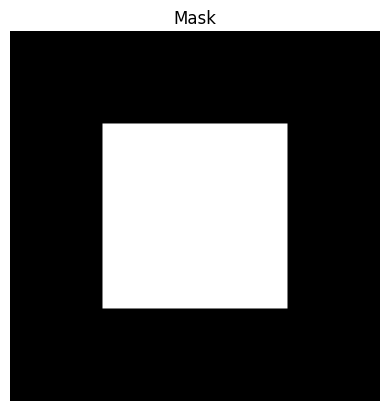

In [13]:
### START CODE HERE ###
   
image_mask = create_image_mask(None, None, None, None)
plt.imshow(image_mask, cmap='gray')
plt.title('Mask')
plt.axis('off')
plt.show()
### END CODE HERE ###

Perform the bitwise AND operation between the image and the mask. Then, display the output as shown in the reference image below.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab1_image-representation/asset/2-4.png)

</details>

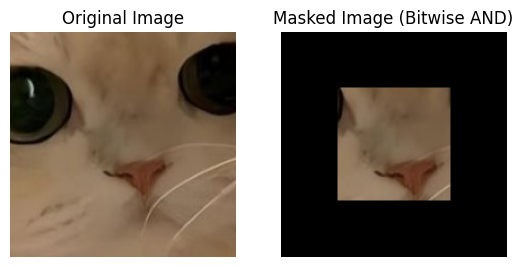

In [14]:
### START CODE HERE ###
fig, axs = plt.subplots(1, 2)
# Perform bitwise AND operation between img1 and image_mask
masked_img = cv2.bitwise_and(img1, img1, mask=image_mask)

# Display the results
axs[0].imshow(img1)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(masked_img)
axs[1].set_title('Masked Image (Bitwise AND)')
axs[1].axis('off')



plt.show()
### END CODE HERE ###

---

## **Question**
1. When performing image subtraction, how does the order of the images (im1-im2 vs. im2-im1) affect the  resulting image?
2. If we want to censor a part of an image, explain your designed mask and the process using logic operation.
3. How would we obtain background of the scene if there are objects moving all the time and some objects moving very slow and sometimes stay still?

In [ ]:
## **Answers**

1. **Image subtraction order effects:**
    When performing image subtraction, the order significantly affects the result:
    - **im1 - im2**: Highlights features present in im1 but not in im2. Negative values are clipped to 0, so areas where im2 > im1 become black.
    - **im2 - im1**: Highlights features present in im2 but not in im1. Areas where im1 > im2 become black.
    - The results are complementary - bright areas in one will be dark in the other.
    - For motion detection, the order determines which direction of movement is emphasized.

2. **Image censoring with masks:**
    To censor part of an image:
    - **Mask design**: Create a binary mask where the censored region is 0 (black) and uncensored regions are 255 (white).
    - **Process**: Use bitwise AND operation between the image and mask: `result = cv2.bitwise_and(image, image, mask=mask)`
    - **Alternative**: Use bitwise OR with an inverted mask to replace censored areas with a specific pattern or color.
    - **Applications**: Blur the censored region first, then use the mask to selectively apply the blur.

3. **Background extraction with moving objects:**
    Several approaches can extract background from scenes with continuous motion:
    - **Temporal median/mode**: Take median or mode pixel values across many frames - stationary background will dominate.
    - **Running average**: Continuously update background model: `background = α × current_frame + (1-α) × background`
    - **Statistical methods**: Use Gaussian Mixture Models (GMM) to model pixel intensity distributions over time.
    - **Frame differencing**: Identify static regions by comparing consecutive frames and build background from these areas.
    - **Selective updating**: Only update background pixels that haven't changed significantly over multiple frames.